In [51]:
import pandas as pd

In [52]:
gdf = pd.read_parquet("full_data_cleaned.parquet")
wdf = pd.read_parquet("weather_cleaned.parquet")

Resmaple bikesharing data to a "reasonable" size

In [53]:
print("original row count: ",gdf.shape[0])
df = gdf[gdf["Duration"]>0].sample(10**7)

original row count:  80457155


In [54]:
df["Date"] = df["Start Date"].apply(lambda x: x.date())

Aggregate data to a daily base

In [55]:
import bamboolib as bam

import pandas as pd; import numpy as np
# Step: Group by and aggregate
ddf = df.groupby(['Date']).agg(**{'Rental Id_size': ('Rental Id', 'size'), 'Duration_sum': ('Duration', 'sum'),'Duration_avg': ('Duration', 'mean')}).reset_index()
ddf.index = pd.DatetimeIndex(ddf['Date'])
ddf.drop(columns=['Date'],inplace=True)
ddf.head()

            Rental Id_size  Duration_sum  Duration_avg
Date                                                  
2015-01-02            1427       1479120   1036.524177
2015-01-03            1969       2589060   1314.911122
2015-01-04            2921       2650260    907.312564
2015-01-05            3615       3487920    964.846473
2015-01-06            3410       3113580    913.073314

In [56]:
aggdf = ddf.join(wdf,how='left')

In [57]:
from pandas_profiling import ProfileReport

report = ProfileReport(aggdf)
report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

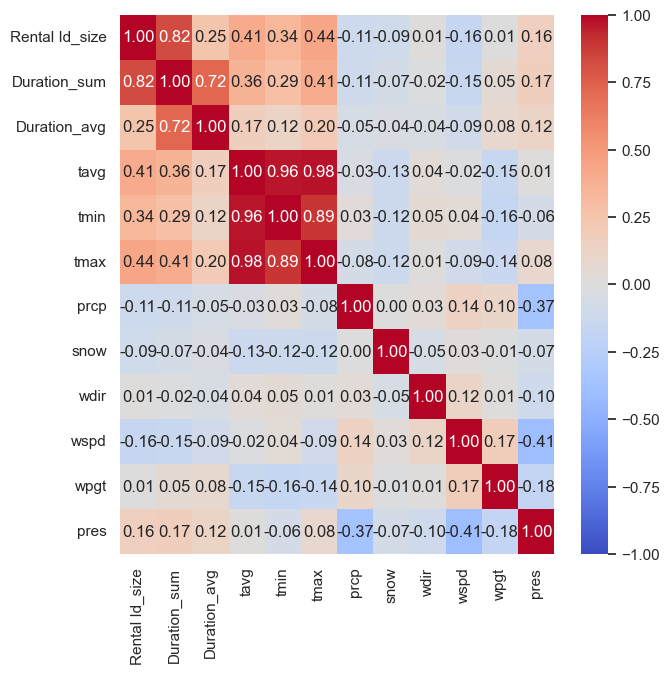

In [71]:
%matplotlib inline
import seaborn as sns
import matplotlib.pyplot as plt

sns.set(rc={"figure.figsize":(7, 7)})

sns.heatmap(aggdf.corr(),annot=True,vmin=-1,vmax=1,fmt=".2f",cmap='coolwarm')
plt.show()

In [59]:
aggdf.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2787 entries, 2015-01-02 to 2022-12-08
Data columns (total 12 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Rental Id_size  2787 non-null   int64  
 1   Duration_sum    2787 non-null   Int64  
 2   Duration_avg    2787 non-null   Float64
 3   tavg            2787 non-null   float64
 4   tmin            2781 non-null   float64
 5   tmax            2783 non-null   float64
 6   prcp            2778 non-null   float64
 7   snow            2787 non-null   float64
 8   wdir            2760 non-null   float64
 9   wspd            2773 non-null   float64
 10  wpgt            2787 non-null   float64
 11  pres            2768 non-null   float64
dtypes: Float64(1), Int64(1), float64(9), int64(1)
memory usage: 353.0 KB


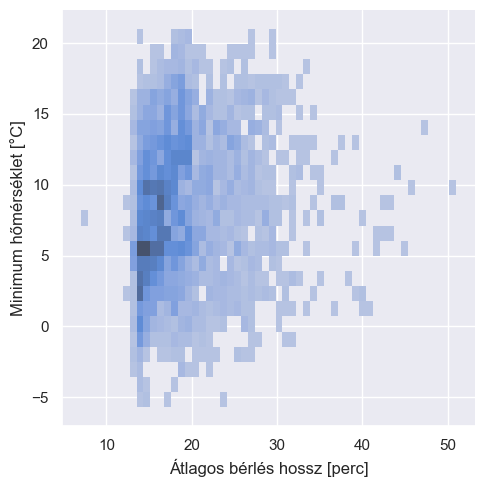

In [60]:
tmp = pd.DataFrame(aggdf[['Duration_avg','tmin']].to_numpy().astype(np.float64),columns=["Avg duration",'tmin'])
#tmp.info()
tmp['Avg duration'] = tmp['Avg duration']/60

sns.displot(data=tmp,x="Avg duration",y="tmin",legend={
    "Avg duration":"Avg duration [perc]"
})
plt.ylabel('Minimum hőmérséklet [°C]')
plt.xlabel('Átlagos bérlés hossz [perc]')
plt.show()

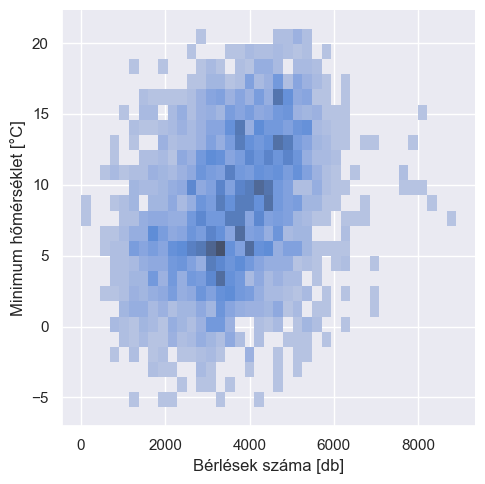

In [61]:
tmp = pd.DataFrame(aggdf[['Rental Id_size','tmin']].to_numpy().astype(np.float64),columns=["Transfer number",'tmin'])
#tmp.info()

sns.displot(data=tmp,x="Transfer number",y="tmin")
plt.ylabel('Minimum hőmérséklet [°C]')
plt.xlabel('Bérlések száma [db]')
plt.show()

#### A britek fáznak?
Ebből a korrelációs mátrixból az látszik, hogy alapvetően a Londoni biciklikölcsönzésre legnagyobb hatással a hőmérséklet van, ott is főleg a kölcsönzések számára. 
Ugyanakkor meglepően semleges az adatsor bármely bérléssel kapcsolatos mérőszáma a csapadék értékekre, ami azt a hipotézist támasztja alá, hogy a britek kevésbé érzékenyek az esőzések mértékére.

Megfigyelhető ugyanakkor hogy minl hidegebb van, annál rövidebbek a bérlések, erre utal az enyhe korreláció a hőmérséklet, és a hossz között.

Az adatok erősen korrelálnak, például a min, max és átlaghőmérsékletek esetén, illetve a bérlések átlagos hosszai, és időtartama a bérlések számával.

Érdekes időjárási korrelációk is láthatóak, amik meteorológiai jellemzőket is bemutatnak:

- csapadék, és légnyomás relatív erős negatív korrelációja
- szélsebbesség és széllökés, a légnyomás relatív erős negatínv  korrelációja



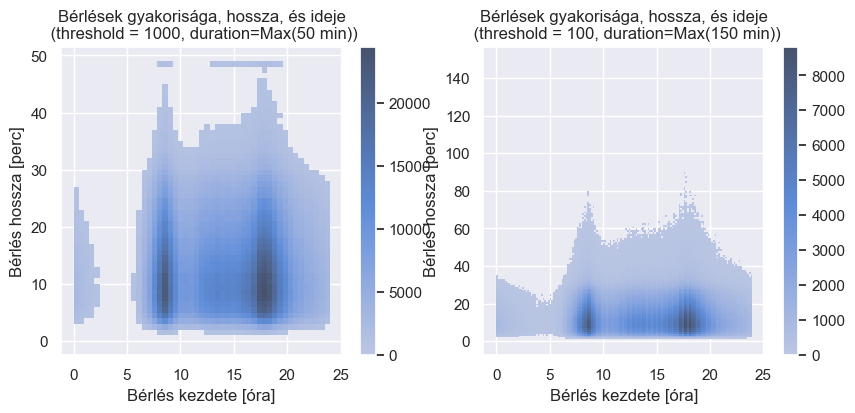

In [62]:
import seaborn as sns
import matplotlib.pyplot as plt

df["Duration minute f"] = pd.DataFrame((df["Duration"]/60).to_numpy().astype(np.int64))
df['Start hour float'] = df['Start hour'].apply(lambda x: x.hour + x.minute/60.)
df['End hour float'] = df['End hour'].apply(lambda x: x.hour + x.minute/60.)
sns.set(rc={"figure.figsize":(10, 4)})
plt.subplot(121)
sns.histplot(df[df["Duration minute f"]<50],x="Start hour float",y="Duration minute f",bins=49,thresh=1000,cbar=True)
plt.ylabel("Bérlés hossza [perc]")
plt.xlabel("Bérlés kezdete [óra]")
plt.title("Bérlések gyakorisága, hossza, és ideje\n (threshold = 1000, duration=Max(50 min))")
plt.subplot(122)
sns.histplot(df[df["Duration minute f"]<150],x="Start hour float",y="Duration minute f",bins=149,thresh=100,cbar=True)
plt.ylabel("Bérlés hossza [perc]")
plt.xlabel("Bérlés kezdete [óra]")
plt.title("Bérlések gyakorisága, hossza, és ideje\n (threshold = 100, duration=Max(150 min))")
plt.show()

In [63]:
import pandas as pd; import numpy as np
# Step: Group by and aggregate
bdf = df.groupby(['Bike Id']).agg({'Rental Id': ['size'], 'Duration': ['sum', 'median', 'std'], 'Date': ['min', 'max']})
bdf.columns = ['_'.join(multi_index) for multi_index in bdf.columns.ravel()]
bdf = bdf.reset_index()

bdf

       Bike Id  Rental Id_size  Duration_sum  Duration_median  Duration_std  \
0            1             709        799737            780.0   1286.211112   
1            2             467        595200            900.0   1711.786186   
2            3             100        114120            780.0   1238.062416   
3            4             650        715945            840.0   1128.806711   
4            5             762        902962            840.0   1511.421797   
...        ...             ...           ...              ...           ...   
22033    23987               1           720            720.0           NaN   
22034    23992               2           840            420.0    169.705627   
22035    23993               2          1380            690.0    381.837662   
22036    23995               1           120            120.0           NaN   
22037    23998               1          1320           1320.0           NaN   

         Date_min    Date_max  
0      2015-01-04  

In [64]:
import plotly.express as px
fig = px.histogram(bdf, title="Bicikli kölcsönzések száma biciklinkként",labels={
    'count':'',
    'Rental Id_size': 'Kölcsönzések száma [db]'
},
x='Rental Id_size')
fig

In [65]:
import plotly.express as px
bdf['Duration hours'] = bdf['Duration_sum']/(60*60)
fig = px.histogram(bdf, x='Duration hours',title="Biciklik kölcsönzési ideje",
labels={
    'Duration hours': 'Kölcsönzés időtartalma [óra]'
}
)
fig

In [70]:
import plotly.express as px
from datetime import datetime
fig = px.histogram(df.sample(10000), x='Start hour float',title="Biciklik kölcsönzési ideje",
labels={
    'Duration hours': 'Kölcsönzés időpontja [óra]'
}
)
fig #broken

In [67]:
import pandas as pd; import numpy as np
# Step: Group by and aggregate
rdf = df.groupby(['EndStation Id', 'StartStation Id']).agg(**{'Rental Id_count': ('Rental Id', 'count'),'EndStation Name': ('EndStation Name', 'first'),'StartStation Name': ('StartStation Name', 'first')}).reset_index()

# Step: Sort column(s) Rental Id_count ascending (A-Z)
rdf = rdf.sort_values(by=['Rental Id_count'], ascending=[False])

rdf

        EndStation Id  StartStation Id  Rental Id_count  \
114713            191              191            19433   
418516            785              785            16058   
182504            303              303            10766   
184734            307              307            10479   
149075            248              248             8616   
...               ...              ...              ...   
22011              38              690                1   
355910            655              638                1   
148079            246              447                1   
22013              38              693                1   
447137            850              850                1   

                                     EndStation Name  \
114713                   Hyde Park Corner, Hyde Park   
418516  Aquatic Centre, Queen Elizabeth Olympic Park   
182504                        Albert Gate, Hyde Park   
184734           Black Lion Gate, Kensington Gardens   
149075     

In [68]:
import pandas as pd; import numpy as np
# Step: Group by and aggregate
lookup = df.groupby(['EndStation Name']).agg(**{'EndStation Id_first': ('EndStation Id', 'first')}).reset_index()
lookup = lookup.sort_values(by=['EndStation Id_first'])
print(lookup[lookup.duplicated('EndStation Id_first',keep=False)])

                                       EndStation Name  EndStation Id_first
508                             Maida Vale, Maida Vale                    8
491                        Lodge Road, St. John's Wood                    8
372                   Hampstead Road (Cartmel), Euston                   21
470                   Lansdowne Drive, Hackney Central                   21
469                    Lansdown Drive, Hackney Central                   21
..                                                 ...                  ...
26   Allington street, Off Victoria Street, Westmin...                  826
27                       Allington street, Westminster                  826
28             Allington street, Westminster, SW1E 5EB                  826
288                           Ferndale Road, Brixton.                   832
287                             Ferndale Road, Brixton                  832

[228 rows x 2 columns]


A legnépszerűbb útvonalak:

In [69]:
for _,i in rdf.head(10).iterrows():
    print(f"{i['StartStation Name']}  -   {i['EndStation Name']}: összesen {i['Rental Id_count']} db bérléssel")

Hyde Park Corner, Hyde Park  -   Hyde Park Corner, Hyde Park: összesen 19433 db bérléssel
Aquatic Centre, Queen Elizabeth Olympic Park  -   Aquatic Centre, Queen Elizabeth Olympic Park: összesen 16058 db bérléssel
Albert Gate, Hyde Park  -   Albert Gate, Hyde Park: összesen 10766 db bérléssel
Black Lion Gate, Kensington Gardens  -   Black Lion Gate, Kensington Gardens: összesen 10479 db bérléssel
Triangle Car Park, Hyde Park  -   Triangle Car Park, Hyde Park: összesen 8616 db bérléssel
Park Lane , Hyde Park  -   Park Lane , Hyde Park: összesen 7574 db bérléssel
Podium, Queen Elizabeth Olympic Park  -   Podium, Queen Elizabeth Olympic Park: összesen 5463 db bérléssel
Palace Gate, Kensington Gardens  -   Palace Gate, Kensington Gardens: összesen 5046 db bérléssel
Wellington Arch, Hyde Park  -   Wellington Arch, Hyde Park: összesen 4589 db bérléssel
Hyde Park Corner, Hyde Park  -   Triangle Car Park, Hyde Park: összesen 3945 db bérléssel


Ebből az a tanulság vonható le, hogy a bicikliket főleg turisztikai céllal használják az emberek, és nem tömegközlekedési céllal.